# IF Analysis Pipeline

Install the package once with: `pip install -e /path/to/IF_analysis`

In [1]:
#%pip install "C:\Users\jamie\Downloads\IF_analysis.tar.gz"
#%pip install upsetplot
import sys
from pathlib import Path


REPO = Path(r"c:\Users\jamie\Downloads\IF_analysis").resolve()
REPO = Path(r"C:\Users\Owner\UK Dementia Research Institute Dropbox\Brancaccio Lab\Jamie\Experiments\IHF Pipeline\IF_analysis").resolve()

# Ensure local repo is first in import resolution
sys.path = [p for p in sys.path if str(REPO).lower() not in str(p).lower()]
sys.path.insert(0, str(REPO))

import IF_analysis

from IF_analysis import (
    create_batch, load_state, save_state, Config,
    Experiment, MiniExperiment, Batch,
    condition, conditionList, zipConditions, zipConditionLists,
    plotting, modelling
)
from IF_analysis.utils import rc_params, get_columns
from IF_analysis.export import convert_name, IF_NAME_MAP, BEHAVIOR_NAME_MAP
from IF_analysis.config import check_directory
import IF_analysis.batch as batch_mod
import IF_analysis.plotting as plotting_mod
import IF_analysis.experiment as experiment_mod
import IF_analysis.stats as stats_mod
import IF_analysis.serialization as serialization_mod
import IF_analysis.__init__ as init_mod
import IF_analysis.export as export_mod
import IF_analysis.modelling as modelling_mod
import IF_analysis.markers as markers_mod
import IF_analysis.factory as factory_mod

import importlib, IF_analysis.plotting as plotting
importlib.reload(plotting)


print("has sentinel:", hasattr(batch_mod, "NOT_INCLUDED_SENTINEL"), getattr(batch_mod, "NOT_INCLUDED_SENTINEL", None))
print(hasattr(IF_analysis.plotting, "JONNNie"))
print(hasattr(IF_analysis.experiment, "adjust_for_volumemm"))
rc_params(font_weight='normal', tick_label_size=20, tick_major_size=11, tick_major_width=2, line_width=2) #format bar aesthetics

has sentinel: True NOT_INCLUDED_IN_EXPERIMENT
False
True


In [2]:
# ── Define conditions (same as before, these are reusable) ──────────

# Viral Vectors
labels = ['Syn-mCherry', r'Syn-$\mathregular{hAPP^{WT}}$-mCh', r'Syn-$\mathregular{hAPP^{NLGF}}$-mCh'] #Appears in graphs
shorthand_names = ['Syn', 'hAPP', 'NLGF'] #Condition naming that appears in raw data
colors = ['#787a7c', '#4369b2', '#9f1c1f'] #Colors for plotting
Syn, hAPP, NLGF = zipConditions(labels, shorthand_names, colors, 'Genotype') #Set multiple conditions at once with zipConditions (returns condition objects with name, shorthand, color, and factor

comparisons = ['1-2', '2-3', '1-3'] #Optional list of comparisons for stats (e.g. 1-2 means compare condition 1 to condition 2)
explanation = 'WT mice injected with <> at 2 months of age.' #Optional explanation that appears in stats tables. <> replaced with condition labels (e.g. 'WT mice injected with Syn-mCherry at 2 months of age.')
genotype_condition_list = conditionList([Syn, hAPP, NLGF], comparisons, explanation=explanation) #Set a list of conditions with conditionList that is applied to an experiment (returns a condition list object with conditions, comparisons, and explanation)

# Culling timepoints after injection
labels = [' 2 Weeks', ' 4 Weeks', ' 8 Weeks']
shorthand_names = ['WeekTwo', 'WeekFour', 'WeekEight']
colors = [None, None, None]
explanation='Culled<> after of viral expression.'
time_conditions = conditionList(
    list(zipConditions(labels, shorthand_names, colors, 'Time')), explanation=explanation)

#Viral Vectors + Culling Timepoints
SynW2, SynW4, SynW8, hAPPW2, hAPPW4, hAPPW8, NLGFW2, NLGFW4, NLGFW8 = zipConditionLists(
    genotype_condition_list, time_conditions) #Set multiple hybrid conditions with zipConditionLists (returns condition objects with name, shorthand, color, and factor that combine the factors of the original conditions)

comparisons = ['1-2', '2-3', '1-3', '4-5', '5-6', '4-6', '7-8', '8-9', '7-9', '1-7', '2-8', '3-9']
AD_Time_condition_list = conditionList(
    [SynW2, hAPPW2, NLGFW2, SynW4, hAPPW4, NLGFW4, SynW8, hAPPW8, NLGFW8], comparisons=comparisons) #Do not give explanation to not override individual factor explanations

#Viral conditions with daily drug
AD_conditions = conditionList(
    [hAPP, NLGF], explanation='WT mice injected with <> at 2 months of age.')

labels = [' + PF-670462', ' + Vehicle']
shorthand_names = ['Drug', 'Veh']
colors = [None, 'grey']
Drug, Vehicle = zipConditions(labels, shorthand_names, colors, 'Drug')
drug_condition_list = conditionList([Vehicle, Drug], explanation="Daily injections of <>.")

CK1I_colors = ['black', '#4369b2', '#613c02', '#9f1c1f']
hAPPVeh, hAPPDrug, NLGFVeh, NLGFDrug = zipConditionLists(AD_conditions, drug_condition_list, CK1I_colors)
CK1I_condition_list = conditionList([hAPPVeh, hAPPDrug, NLGFVeh, NLGFDrug], ['1-2', '3-4'])

#APP-WT and NLGF background conditions
labels = ['WT', r'$\mathregular{APP^{NLGF}}$']
shorthand_names = ['WT', 'NLGF']
colors = ["#787a7c", "#9f1c1f"]
WT, NLGFKI = zipConditions(labels, shorthand_names, colors, 'Genotype')
NLGFKI_condition_list = conditionList([WT, NLGFKI], ['1-2'], explanation='APP-<> genetic background')

Male, Female = zipConditions(['Male', 'Female'], ['Ma', 'Fe'], [None, None], 'Sex')
sex_condition_list = conditionList([Male, Female], ['1-2'], explanation='<> Sex')

WTMa, WTFe, NLGFKIMa, NLGFKIFe = zipConditionLists(NLGFKI_condition_list, sex_condition_list)
NLGFKI_sex_condition_list = conditionList(
    [WTMa, NLGFKIMa, WTFe, NLGFKIFe], ['1-2', '3-4', '1-3', '2-4'])

#Capsid conditions
Luc = condition("Syn-Luc-mCherry", "Luc", "#f200ff", 'Genotype')
capsid_conditions = conditionList(
    [Syn, Luc, hAPP, NLGF], explanation='WT mice injected with <> at 2 months of age.')

labels = ['UNC', 'VB']
shorthand_names = ['UNC', 'VB']
colors = [None, None]
UNC, VB = zipConditions(labels, shorthand_names, colors, factor='Manufacturer')
capsid_manufacs = conditionList(
    [UNC, VB], explanation='AAVs manufactured by <>'
)

In [3]:
# ── Experiment Folder Paths ──────────────────────────────────────────────────────────
PICKLE_DIR = check_directory('C:/Users/Owner/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Big Data/Pickles') #Directory to save serialized data
# ── Create batches (auto-discovers experiments from folder structure) ──
# First run: processes all data and saves pickle
# Subsequent runs: loads from pickle instantly (set rerun=True to force reprocess)

FORCE_REPROCESS = False

#Injected with Syn- mCherry, hAPP-WT-mCherry, or hAPP-NLGF-mCherry in DD for 2, 4, or 8 weeks
batch1_path = check_directory('C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks')
batch1 = create_batch('batch1', AD_Time_condition_list, batch1_path, pickle_path=PICKLE_DIR, rerun=FORCE_REPROCESS)

#Injected with Syn- hAPP-WT-mCherry or hAPP-NLGF-mCherry in DD for 4 weeks with daily PF-670462 or vehicle injections
CK1I_path = check_directory('C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/CK1I')
batch_CK1I = create_batch('CK1I', CK1I_condition_list, CK1I_path, pickle_path=PICKLE_DIR, rerun=FORCE_REPROCESS)
batch_CK1I.summary = batch_CK1I.summary[batch_CK1I.summary['AnimalName'] != "NLGFVeh20"] #drop NLGFVeh20 which had a failed injection

#APP-WT or APP-NLGF genetic background
batch_NLGFLKI_path = check_directory("C:/Users/Owner/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/NLGFKI")
batch_NLGFKI = create_batch("batch_NLGFKI", NLGFKI_sex_condition_list, batch_NLGFLKI_path, pickle_path=PICKLE_DIR, rerun=FORCE_REPROCESS)

#Injected with Syn-Luc-mCherry, Syn-hAPP-WT-mCherry, or Syn-hAPP-NLGF-mCherry capsids from different manufacturers, serotypes and titres as controls for capsid, manufacturer, serotype, and titre effects
capsid_file = check_directory("C:/Users/Owner/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/Capsid Controls")
capsid_controls = create_batch("capsid_controls", capsid_conditions, capsid_file, pickle_path=PICKLE_DIR, rerun=FORCE_REPROCESS)

In [5]:
# ── Export Excels ─────────────────────────────────────────────
batch1.export_all_excel()
batch_CK1I.export_all_excel()
batch_NLGFKI.export_all_excel()

Exported IF summary to C:/Users/Owner/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Exports/IF_Summary.xlsx
['CK1d_XMMean', 'CK1d_YMMean', 'CK1d_ZMMean', 'CK1d_ClosestTo_DAPIMean', 'CK1d_NumClosestTo_DAPIMean', 'CK1d_ClosestTo_GFAPMean', 'CK1d_NumClosestTo_GFAPMean', 'CK1d_ClosestTo_mCherryMean', 'CK1d_NumClosestTo_mCherryMean', 'CK1d_DistToVentricleMean', 'CK1d_NonColocCountDAPI', 'CK1d_NonColocCountGFAP', 'CK1d_NonColocCountmCherry', 'CK1d_NonColocCountmCherry%', 'CK1d_NonColocCountDAPI%', 'CK1d_NonColocCountGFAP%', 'DAPI_VolumeMean_exp1', 'DAPI_SurfaceMean_exp1', 'DAPI_IntDenMean_exp1', 'DAPI_MeanIntDenMean_exp1', 'DAPI_XMMean_exp1', 'DAPI_YMMean_exp1', 'DAPI_ZMMean_exp1', 'DAPI_ColocmCherryMean_exp1', 'DAPI_SAtoVolumeRatioMean_exp1', 'DAPI_RawYMMean_exp1', 'DAPI_RawXMMean_exp1', 'DAPI_ClosestTo_CK1dMean', 'DAPI_NumClosestTo_CK1dMean', 'DAPI_DistToClosest_mCherryMean_exp1', 'DAPI_ClosestTo_GFAPMean', 'DAPI_NumClosestTo_GFAP

In [ ]:
# ── Plot Mean Bars ─────────────────────────────────────────────
from IF_analysis import stats as IF_stats
rc_params(font_weight='normal', tick_label_size=20, tick_major_size=11, tick_major_width=2, line_width=2) #format bar aesthetics
bar_columns = ['IntDen', 'Count', '%Area', 'Contains', 'Coloc'] #search query for columns to plot
exclude_columns = ['Combo']
batch1_specificities = [("Time", 'WeekTwo'), ('Time', 'WeekFour'), ('Time', 'WeekEight')] #conditions to plot separately (e.g. by timepoint) - list of tuples with factor and level (e.g. ("Time", 'WeekTwo'))
CK1I_specificities = [("Genotype", 'hAPP'), ('Genotype', 'NLGF'),] #conditions to plot separately (e.g. by genotype) - list of tuples with factor and level (e.g. ("Genotype", 'hAPP'))

plotting.plot_mean_bars(batch1, column_strings=bar_columns, exclude=exclude_columns, bottom_tick_labels=False) #plotting all timepoints
plotting.plot_mean_bars(batch1, column_strings=bar_columns, exclude=exclude_columns, specificity=batch1_specificities, bottom_tick_labels=False) #plotting by timepoint
plotting.plot_mean_bars(batch_CK1I, column_strings=bar_columns, exclude=exclude_columns, bottom_tick_labels=False) #plotting both genotypes
plotting.plot_mean_bars(batch_CK1I, column_strings=bar_columns, exclude=exclude_columns, specificity=CK1I_specificities, bottom_tick_labels=False) #plotting geneotypes individually to preserve power
plotting.plot_mean_bars(batch_NLGFKI, column_strings=bar_columns, exclude=exclude_columns, bottom_tick_labels=False) #plotting sexes separetley
plotting.plot_mean_bars(batch_NLGFKI, column_strings=bar_columns, exclude=exclude_columns, factor='Genotype', bottom_tick_labels=False) #plotting sexes combined


[plot_mean_bars] Saved columns (192): CK1d_ColocCountDAPI, CK1d_NonColocCountDAPI, CK1d_ColocCountGFAP, CK1d_NonColocCountGFAP, CK1d_ColocCountmCherry, CK1d_NonColocCountmCherry, CK1d_ColocCountmCherry%, CK1d_NonColocCountmCherry%, CK1d_ColocCountDAPI%, CK1d_NonColocCountDAPI%, CK1d_ColocCountGFAP%, CK1d_NonColocCountGFAP%, DAPI_ColocCountGFAP, DAPI_NonColocCountGFAP, DAPI_ColocCountmCherry_exp1, DAPI_NonColocCountmCherry_exp1, DAPI_ColocCountCK1d, DAPI_NonColocCountCK1d, DAPI_ColocCountmCherry%_exp1, DAPI_NonColocCountmCherry%_exp1, DAPI_ColocCountCK1d%, DAPI_NonColocCountCK1d%, DAPI_ColocCountGFAP%, DAPI_NonColocCountGFAP%, GFAP_ColocCountDAPI, GFAP_NonColocCountDAPI, GFAP_ColocCountmCherry, GFAP_NonColocCountmCherry, GFAP_ColocCountCK1d, GFAP_NonColocCountCK1d, GFAP_ColocCountmCherry%, GFAP_NonColocCountmCherry%, GFAP_ColocCountCK1d%, GFAP_NonColocCountCK1d%, GFAP_ColocCountDAPI%, GFAP_NonColocCountDAPI%, mCherry_ColocCountDAPI_exp1, mCherry_NonColocCountDAPI_exp1, mCherry_ColocCou


[plot_mean_bars] Saved columns (192): CK1d_ColocCountDAPI, CK1d_NonColocCountDAPI, CK1d_ColocCountGFAP, CK1d_NonColocCountGFAP, CK1d_ColocCountmCherry, CK1d_NonColocCountmCherry, CK1d_ColocCountmCherry%, CK1d_NonColocCountmCherry%, CK1d_ColocCountDAPI%, CK1d_NonColocCountDAPI%, CK1d_ColocCountGFAP%, CK1d_NonColocCountGFAP%, DAPI_ColocCountGFAP, DAPI_NonColocCountGFAP, DAPI_ColocCountmCherry_exp1, DAPI_NonColocCountmCherry_exp1, DAPI_ColocCountCK1d, DAPI_NonColocCountCK1d, DAPI_ColocCountmCherry%_exp1, DAPI_NonColocCountmCherry%_exp1, DAPI_ColocCountCK1d%, DAPI_NonColocCountCK1d%, DAPI_ColocCountGFAP%, DAPI_NonColocCountGFAP%, GFAP_ColocCountDAPI, GFAP_NonColocCountDAPI, GFAP_ColocCountmCherry, GFAP_NonColocCountmCherry, GFAP_ColocCountCK1d, GFAP_NonColocCountCK1d, GFAP_ColocCountmCherry%, GFAP_NonColocCountmCherry%, GFAP_ColocCountCK1d%, GFAP_NonColocCountCK1d%, GFAP_ColocCountDAPI%, GFAP_NonColocCountDAPI%, mCherry_ColocCountDAPI_exp1, mCherry_NonColocCountDAPI_exp1, mCherry_ColocCou


[plot_mean_bars] Saved columns (192): CK1d_ColocCountDAPI, CK1d_NonColocCountDAPI, CK1d_ColocCountGFAP, CK1d_NonColocCountGFAP, CK1d_ColocCountmCherry, CK1d_NonColocCountmCherry, CK1d_ColocCountmCherry%, CK1d_NonColocCountmCherry%, CK1d_ColocCountDAPI%, CK1d_NonColocCountDAPI%, CK1d_ColocCountGFAP%, CK1d_NonColocCountGFAP%, DAPI_ColocCountGFAP, DAPI_NonColocCountGFAP, DAPI_ColocCountmCherry_exp1, DAPI_NonColocCountmCherry_exp1, DAPI_ColocCountCK1d, DAPI_NonColocCountCK1d, DAPI_ColocCountmCherry%_exp1, DAPI_NonColocCountmCherry%_exp1, DAPI_ColocCountCK1d%, DAPI_NonColocCountCK1d%, DAPI_ColocCountGFAP%, DAPI_NonColocCountGFAP%, GFAP_ColocCountDAPI, GFAP_NonColocCountDAPI, GFAP_ColocCountmCherry, GFAP_NonColocCountmCherry, GFAP_ColocCountCK1d, GFAP_NonColocCountCK1d, GFAP_ColocCountmCherry%, GFAP_NonColocCountmCherry%, GFAP_ColocCountCK1d%, GFAP_NonColocCountCK1d%, GFAP_ColocCountDAPI%, GFAP_NonColocCountDAPI%, mCherry_ColocCountDAPI_exp1, mCherry_NonColocCountDAPI_exp1, mCherry_ColocCou


[plot_mean_bars] Saved columns (192): CK1d_ColocCountDAPI, CK1d_NonColocCountDAPI, CK1d_ColocCountGFAP, CK1d_NonColocCountGFAP, CK1d_ColocCountmCherry, CK1d_NonColocCountmCherry, CK1d_ColocCountmCherry%, CK1d_NonColocCountmCherry%, CK1d_ColocCountDAPI%, CK1d_NonColocCountDAPI%, CK1d_ColocCountGFAP%, CK1d_NonColocCountGFAP%, DAPI_ColocCountGFAP, DAPI_NonColocCountGFAP, DAPI_ColocCountmCherry_exp1, DAPI_NonColocCountmCherry_exp1, DAPI_ColocCountCK1d, DAPI_NonColocCountCK1d, DAPI_ColocCountmCherry%_exp1, DAPI_NonColocCountmCherry%_exp1, DAPI_ColocCountCK1d%, DAPI_NonColocCountCK1d%, DAPI_ColocCountGFAP%, DAPI_NonColocCountGFAP%, GFAP_ColocCountDAPI, GFAP_NonColocCountDAPI, GFAP_ColocCountmCherry, GFAP_NonColocCountmCherry, GFAP_ColocCountCK1d, GFAP_NonColocCountCK1d, GFAP_ColocCountmCherry%, GFAP_NonColocCountmCherry%, GFAP_ColocCountCK1d%, GFAP_NonColocCountCK1d%, GFAP_ColocCountDAPI%, GFAP_NonColocCountDAPI%, mCherry_ColocCountDAPI_exp1, mCherry_NonColocCountDAPI_exp1, mCherry_ColocCou


[plot_mean_bars] Saved columns (96): Caspase3_ColocCountDAPI, Caspase3_NonColocCountDAPI, Caspase3_ColocCountmCherry, Caspase3_NonColocCountmCherry, Caspase3_ColocCountMOAB-2, Caspase3_NonColocCountMOAB-2, Caspase3_ColocCountmCherry%, Caspase3_NonColocCountmCherry%, Caspase3_ColocCountMOAB-2%, Caspase3_NonColocCountMOAB-2%, Caspase3_ColocCountDAPI%, Caspase3_NonColocCountDAPI%, DAPI_ColocCountCaspase3, DAPI_NonColocCountCaspase3, DAPI_ColocCountmCherry_exp1, DAPI_NonColocCountmCherry_exp1, DAPI_ColocCountMOAB-2, DAPI_NonColocCountMOAB-2, DAPI_ColocCountmCherry%_exp1, DAPI_NonColocCountmCherry%_exp1, DAPI_ColocCountCaspase3%, DAPI_NonColocCountCaspase3%, DAPI_ColocCountMOAB-2%, DAPI_NonColocCountMOAB-2%, mCherry_ColocCountDAPI_exp1, mCherry_NonColocCountDAPI_exp1, mCherry_ColocCountCaspase3, mCherry_NonColocCountCaspase3, mCherry_ColocCountMOAB-2, mCherry_NonColocCountMOAB-2, mCherry_ColocCountCaspase3%, mCherry_NonColocCountCaspase3%, mCherry_ColocCountMOAB-2%, mCherry_NonColocCountMO


[plot_mean_bars] Saved columns (96): Caspase3_ColocCountDAPI, Caspase3_NonColocCountDAPI, Caspase3_ColocCountmCherry, Caspase3_NonColocCountmCherry, Caspase3_ColocCountMOAB-2, Caspase3_NonColocCountMOAB-2, Caspase3_ColocCountmCherry%, Caspase3_NonColocCountmCherry%, Caspase3_ColocCountMOAB-2%, Caspase3_NonColocCountMOAB-2%, Caspase3_ColocCountDAPI%, Caspase3_NonColocCountDAPI%, DAPI_ColocCountCaspase3, DAPI_NonColocCountCaspase3, DAPI_ColocCountmCherry_exp1, DAPI_NonColocCountmCherry_exp1, DAPI_ColocCountMOAB-2, DAPI_NonColocCountMOAB-2, DAPI_ColocCountmCherry%_exp1, DAPI_NonColocCountmCherry%_exp1, DAPI_ColocCountCaspase3%, DAPI_NonColocCountCaspase3%, DAPI_ColocCountMOAB-2%, DAPI_NonColocCountMOAB-2%, mCherry_ColocCountDAPI_exp1, mCherry_NonColocCountDAPI_exp1, mCherry_ColocCountCaspase3, mCherry_NonColocCountCaspase3, mCherry_ColocCountMOAB-2, mCherry_NonColocCountMOAB-2, mCherry_ColocCountCaspase3%, mCherry_NonColocCountCaspase3%, mCherry_ColocCountMOAB-2%, mCherry_NonColocCountMO


[plot_mean_bars] Saved columns (96): Caspase3_ColocCountDAPI, Caspase3_NonColocCountDAPI, Caspase3_ColocCountmCherry, Caspase3_NonColocCountmCherry, Caspase3_ColocCountMOAB-2, Caspase3_NonColocCountMOAB-2, Caspase3_ColocCountmCherry%, Caspase3_NonColocCountmCherry%, Caspase3_ColocCountMOAB-2%, Caspase3_NonColocCountMOAB-2%, Caspase3_ColocCountDAPI%, Caspase3_NonColocCountDAPI%, DAPI_ColocCountCaspase3, DAPI_NonColocCountCaspase3, DAPI_ColocCountmCherry_exp1, DAPI_NonColocCountmCherry_exp1, DAPI_ColocCountMOAB-2, DAPI_NonColocCountMOAB-2, DAPI_ColocCountmCherry%_exp1, DAPI_NonColocCountmCherry%_exp1, DAPI_ColocCountCaspase3%, DAPI_NonColocCountCaspase3%, DAPI_ColocCountMOAB-2%, DAPI_NonColocCountMOAB-2%, mCherry_ColocCountDAPI_exp1, mCherry_NonColocCountDAPI_exp1, mCherry_ColocCountCaspase3, mCherry_NonColocCountCaspase3, mCherry_ColocCountMOAB-2, mCherry_NonColocCountMOAB-2, mCherry_ColocCountCaspase3%, mCherry_NonColocCountCaspase3%, mCherry_ColocCountMOAB-2%, mCherry_NonColocCountMO


[plot_mean_bars] Saved columns (192): CD68_ColocCountDAPI, CD68_NonColocCountDAPI, CD68_ColocCountGFAP, CD68_NonColocCountGFAP, CD68_ColocCountCK1d, CD68_NonColocCountCK1d, CD68_ColocCountCK1d%, CD68_NonColocCountCK1d%, CD68_ColocCountDAPI%, CD68_NonColocCountDAPI%, CD68_ColocCountGFAP%, CD68_NonColocCountGFAP%, CK1d_ColocCountDAPI_exp1, CK1d_NonColocCountDAPI_exp1, CK1d_ColocCountGFAP, CK1d_NonColocCountGFAP, CK1d_ColocCountCD68, CK1d_NonColocCountCD68, CK1d_ColocCountCD68%, CK1d_NonColocCountCD68%, CK1d_ColocCountDAPI%_exp1, CK1d_NonColocCountDAPI%_exp1, CK1d_ColocCountGFAP%, CK1d_NonColocCountGFAP%, DAPI_ColocCountGFAP_exp1, DAPI_NonColocCountGFAP_exp1, DAPI_ColocCountCD68, DAPI_NonColocCountCD68, DAPI_ColocCountCK1d_exp1, DAPI_NonColocCountCK1d_exp1, DAPI_ColocCountCD68%, DAPI_NonColocCountCD68%, DAPI_ColocCountCK1d%_exp1, DAPI_NonColocCountCK1d%_exp1, DAPI_ColocCountGFAP%_exp1, DAPI_NonColocCountGFAP%_exp1, GFAP_ColocCountDAPI_exp1, GFAP_NonColocCountDAPI_exp1, GFAP_ColocCountCD6


[plot_mean_bars] Saved columns (192): CD68_ColocCountDAPI, CD68_NonColocCountDAPI, CD68_ColocCountGFAP, CD68_NonColocCountGFAP, CD68_ColocCountCK1d, CD68_NonColocCountCK1d, CD68_ColocCountCK1d%, CD68_NonColocCountCK1d%, CD68_ColocCountDAPI%, CD68_NonColocCountDAPI%, CD68_ColocCountGFAP%, CD68_NonColocCountGFAP%, CK1d_ColocCountDAPI_exp1, CK1d_NonColocCountDAPI_exp1, CK1d_ColocCountGFAP, CK1d_NonColocCountGFAP, CK1d_ColocCountCD68, CK1d_NonColocCountCD68, CK1d_ColocCountCD68%, CK1d_NonColocCountCD68%, CK1d_ColocCountDAPI%_exp1, CK1d_NonColocCountDAPI%_exp1, CK1d_ColocCountGFAP%, CK1d_NonColocCountGFAP%, DAPI_ColocCountGFAP_exp1, DAPI_NonColocCountGFAP_exp1, DAPI_ColocCountCD68, DAPI_NonColocCountCD68, DAPI_ColocCountCK1d_exp1, DAPI_NonColocCountCK1d_exp1, DAPI_ColocCountCD68%, DAPI_NonColocCountCD68%, DAPI_ColocCountCK1d%_exp1, DAPI_NonColocCountCK1d%_exp1, DAPI_ColocCountGFAP%_exp1, DAPI_NonColocCountGFAP%_exp1, GFAP_ColocCountDAPI_exp1, GFAP_NonColocCountDAPI_exp1, GFAP_ColocCountCD6

{'condition': [None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  N

In [23]:
# ── Plot Correlation Matrices ─────────────────────────────────────────────
#Full correlation matrix
#batch1.summary = batch1.summary.drop(columns=['IVMean_exp4', 'IVMean_exp3', 'PeriodMean_exp3', 'PeriodMean_exp4'])
matrix_columns = ['IntDen', 'Count', '%Area', 'Period', 'IV'] #Include columns with these strings
exclude = ['Coloc', 'Raw', 'DAPI', 'IntDenMean', 'Error'] #exclude columns with these strings
matrix_order = ['Period', 'IV', 'H31L21', 'MOAB-2', 'Caspase3', 'Iba1', 'IgG', 'GFAP', 'AF488', 'CK1d'] #Order of columns as they appear in the matrix
#plotting.plot_matrices(batch1, column_strings=matrix_columns, exclude=exclude, prefix_order=matrix_order, factor='Genotype', specificity=("Time", "WeekFour", "WeekEight"))

#Rectangle correlation matrix
batch1.summary['LocomotoractivityIR(counts)Mean'] = batch1.summary['LocomotoractivityIR(counts)Mean_exp4']
batch1.summary['AOE'] = batch1.summary['Period_ErrorMean_exp2']
rect_matrix_columns = ['H31L21_IntDenTotal', 'H31L21_Count', 'MOAB-2_IntDenTotal', 'MOAB-2_Count',  'Caspase3_IntDenTotal', 'Caspase3_Count', 'Iba1_ROI_%Area' ,'Iba1_IntDenTotal', 'GFAP_ROI_%Area' ,'GFAP_IntDenTotal',   'mCherry_ROI_IntDenMean'] #Include columns with these strings on y-axis
#rect_matrix_columns = ['burdenScore', 'fragmentationScore', 'CK1d_ColocCountmCherry', 'mCherry_Contains_CK1d']# 'H31L21_Count', 'MOAB-2_IntDenTotal', 'MOAB-2_Count', 'Caspase3_IntDenTotal', 'Caspase3_Count', 'Iba1_ROI_%Area' ,'Iba1_IntDenTotal', 'GFAP_ROI_%Area' ,'GFAP_IntDenTotal',   'mCherry_ROI_IntDenMean'] #Include columns with these strings on y-axis
rect_matrix_order = ['H31L21', 'MOAB-2', 'Caspase3', 'Iba1', 'GFAP', 'mCherry', 'CK1d'] #Order of columns as they appear in the matrix
against_columns = ['PeriodMean', 'AOE', 'LocomotoractivityIR(counts)'] #Include columns with these strings on x-axis
against_columns_order = ['Period', 'AOE', 'Locomotor'] #Order of columns as they appear in the matrix
specificity = ('Time', 'WeekFour', 'WeekEight') #Specific conditions to plot
plotting.plot_rect_matrices(batch1, column_strings=rect_matrix_columns, against_column_strings=against_columns, exclude=['Error', '_exp3', '_exp4', '_exp1', 'Combo'], against_exclude=['Error', 'exp4', 'exp3'], column_order=rect_matrix_order, against_order=against_columns_order, factor='Genotype', specificity=specificity, blank_panel_on_nan=True)

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Matrices\Rectangular\Genotype\Time\WeekFour and WeekEight\Rectangular Correlation Matr_3c8a695095.svg


{'Syn': {'correlations': {'H31L21_Count vs PeriodMean_exp2': (nan, nan),
   'H31L21_Count vs AOE': (nan, nan),
   'H31L21_Count vs LocomotoractivityIR(counts)Mean': (nan, nan),
   'H31L21_IntDenTotal vs PeriodMean_exp2': (nan, nan),
   'H31L21_IntDenTotal vs AOE': (nan, nan),
   'H31L21_IntDenTotal vs LocomotoractivityIR(counts)Mean': (nan, nan),
   'MOAB-2_Count vs PeriodMean_exp2': (0.3999711992102543, 0.3468239721995676),
   'MOAB-2_Count vs AOE': (0.8210381889372467, -0.09603513739097505),
   'MOAB-2_Count vs LocomotoractivityIR(counts)Mean': (0.08847647936827542,
    -0.9903580188633658),
   'MOAB-2_IntDenTotal vs PeriodMean_exp2': (0.42927693422707897,
    0.32693528926426313),
   'MOAB-2_IntDenTotal vs AOE': (0.791425570021276, -0.11217721500700663),
   'MOAB-2_IntDenTotal vs LocomotoractivityIR(counts)Mean': (0.10685391665983872,
    -0.985946942461732),
   'Caspase3_Count vs PeriodMean_exp2': (0.5160552304886052,
    -0.271093056434337),
   'Caspase3_Count vs AOE': (0.13250423

In [9]:
# ── Plot Regressions ─────────────────────────────────────────────
rc_params(font_weight='normal', tick_label_size=20, tick_major_size=11, tick_major_width=2, line_width=2) #format bar aesthetics
main_figure_cols_with_period = ['H31L21_Count', 'H31L21_IntDenTotal', 'MOAB-2_burdenScore', 'MOAB-2_Count', 'MOAB-2_IntDenTotal', 'Iba1_ROI_%AreaMean', 'GFAP_ROI_%AreaMean'] #Columns to plot against behaviour
specificities = [("Time", "WeekEight"), ("Time", "WeekEight", "WeekFour")] #Specific conditions to plot
plotting.plot_regressions(batch1, 'PeriodMean_exp2', main_figure_cols_with_period, specificity=specificities, factor='Genotype', normalize_y=False, combine=True)
#plotting.plot_regressions(batch1, 'mCherry_ROI_IntDenMean_exp2', ['MOAB-2_IntDenTotal', 'MOAB-2_Count', 'H31L21_IntDenTotal', 'H31L21_Count'], specificity=[("Time", "WeekEight"), ("Time", "WeekEight", "WeekFour")], factor='Genotype', normalize_y=False, combine=True)

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight\PeriodMean_exp2 vs H31L21_Count (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight and WeekFour\PeriodMean_exp2 vs H31L21_Count (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight\PeriodMean_exp2 vs H31L21_IntDenTotal (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight and WeekFour\PeriodMean_exp2 vs H31L21_IntDenTotal (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight\PeriodMean_exp2 vs MOAB2_burdenScore (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight and WeekFour\PeriodMean_exp2 vs MOAB2_burdenScore (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight\PeriodMean_exp2 vs MOAB2_Count (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight and WeekFour\PeriodMean_exp2 vs MOAB2_Count (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight\PeriodMean_exp2 vs MOAB2_IntDenTotal (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight and WeekFour\PeriodMean_exp2 vs MOAB2_IntDenTotal (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight\PeriodMean_exp2 vs Iba1_ROI_AreaMean (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight and WeekFour\PeriodMean_exp2 vs Iba1_ROI_AreaMean (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight\PeriodMean_exp2 vs GFAP_ROI_AreaMean (Combined).svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Regressions\Genotype\Time\WeekEight and WeekFour\PeriodMean_exp2 vs GFAP_ROI_AreaMean (Combined).svg


{('PeriodMean_exp2',
  'H31L21_Count'): {('Time',
   'WeekEight'): {'regression': [<Axes: xlabel='Period', ylabel='H31L21 Count / mm³'>,
    <Axes: xlabel='Period', ylabel='H31L21 Count / mm³'>,
    <Axes: xlabel='Period', ylabel='H31L21 Count / mm³'>], 'r': [nan,
    0.4526097460608244,
    0.42421722161659886], 'p': [nan,
    0.3674451974347235,
    0.47653834804825834], 'group': ['Syn-mCherry',
    'Syn-$\\mathregular{hAPP^{WT}}$-mCh',
    'Syn-$\\mathregular{hAPP^{NLGF}}$-mCh']}, ('Time',
   'WeekEight',
   'WeekFour'): {'regression': [<Axes: xlabel='Period', ylabel='H31L21 Count / mm³'>,
    <Axes: xlabel='Period', ylabel='H31L21 Count / mm³'>,
    <Axes: xlabel='Period', ylabel='H31L21 Count / mm³'>],
   'r': [nan, -0.17596857824933937, 0.5021646297016625],
   'p': [nan, 0.6267682918477635, 0.1391242934122117],
   'group': ['Syn-mCherry',
    'Syn-$\\mathregular{hAPP^{WT}}$-mCh',
    'Syn-$\\mathregular{hAPP^{NLGF}}$-mCh']}},
 ('PeriodMean_exp2',
  'H31L21_IntDenTotal'): {('Time'

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\CK1d\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_Syn.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\CK1d\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_hAPP.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\CK1d\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_NLGF.svg



Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Iba1\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_Syn.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Iba1\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_hAPP.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Iba1\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_NLGF.svg



Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Caspase3\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_Syn.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Caspase3\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_hAPP.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Caspase3\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_NLGF.svg



Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\AF488\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_Syn.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\AF488\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_hAPP.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\AF488\Genotype\UpSet Plot_rawcounts_noClosest_Genotype_NLGF.svg



{'CK1d': {'Syn': <Figure size 586.667x488.889 with 4 Axes>,
  'hAPP': <Figure size 1026.67x635.556 with 4 Axes>,
  'NLGF': <Figure size 1026.67x586.667 with 4 Axes>},
 'Iba1': {'Syn': <Figure size 733.333x635.556 with 4 Axes>,
  'hAPP': <Figure size 3031.11x635.556 with 4 Axes>,
  'NLGF': <Figure size 2591.11x635.556 with 4 Axes>},
 'Caspase3': {'Syn': <Figure size 782.222x635.556 with 4 Axes>,
  'hAPP': <Figure size 2786.67x635.556 with 4 Axes>,
  'NLGF': <Figure size 2640x635.556 with 4 Axes>},
 'AF488': {'Syn': <Figure size 1124.44x537.778 with 4 Axes>,
  'hAPP': <Figure size 1124.44x537.778 with 4 Axes>,
  'NLGF': <Figure size 1124.44x537.778 with 4 Axes>}}

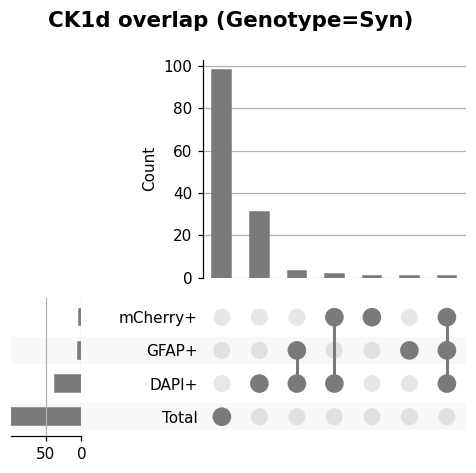

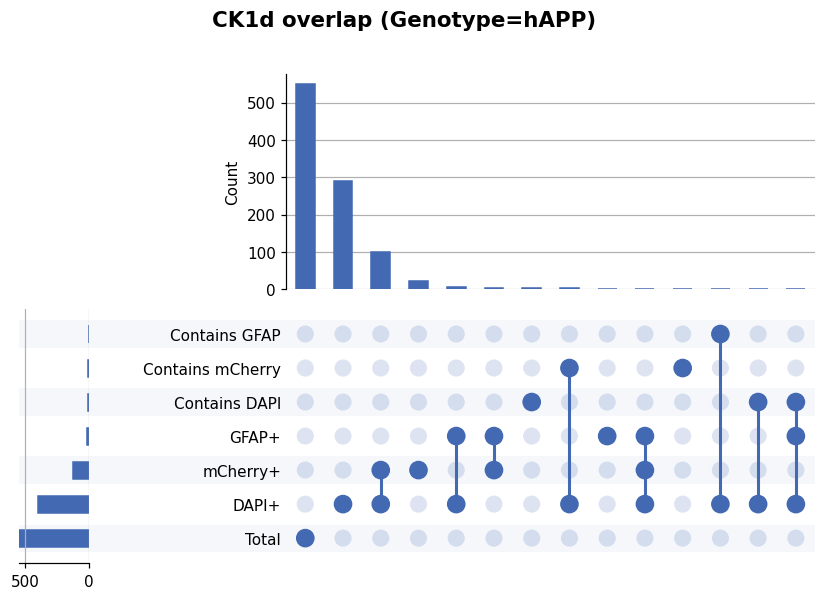

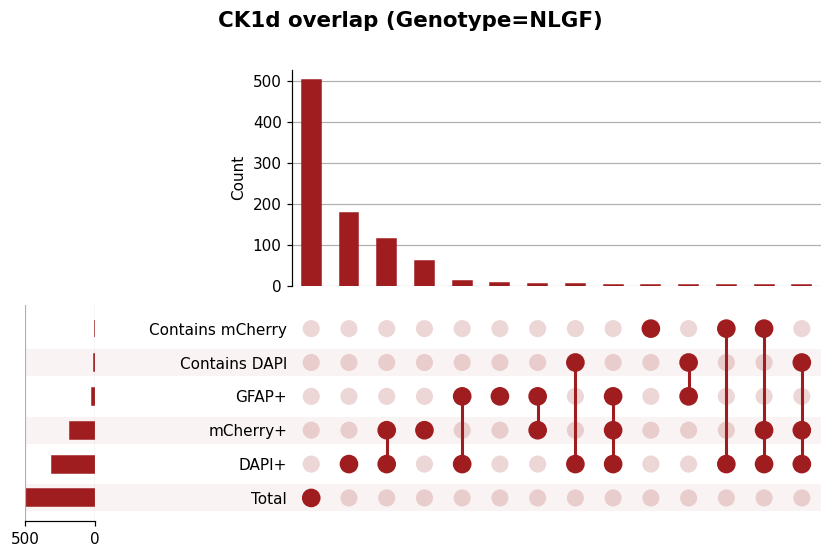

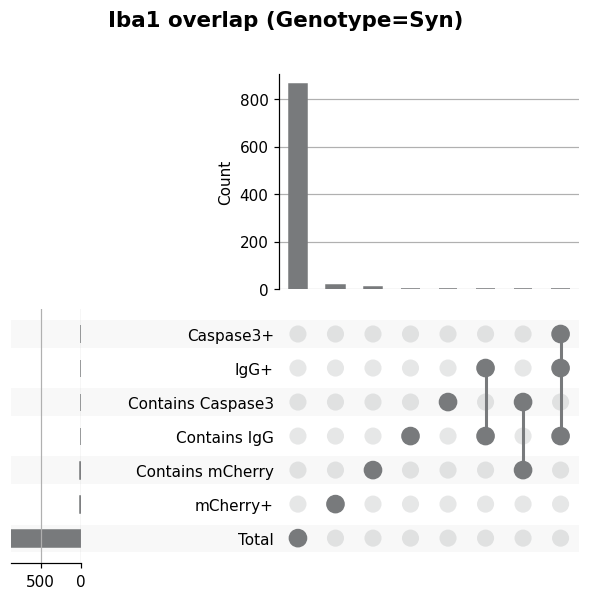

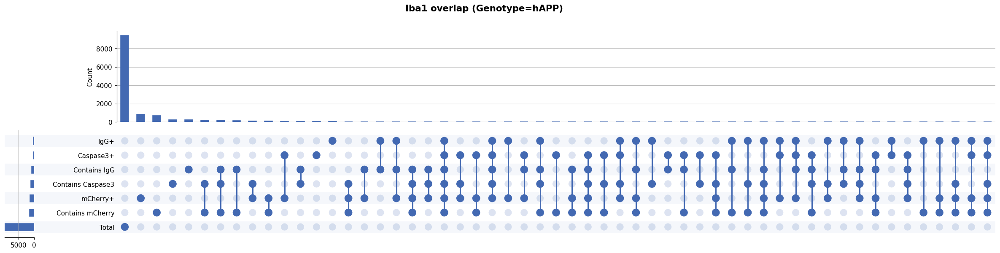

...

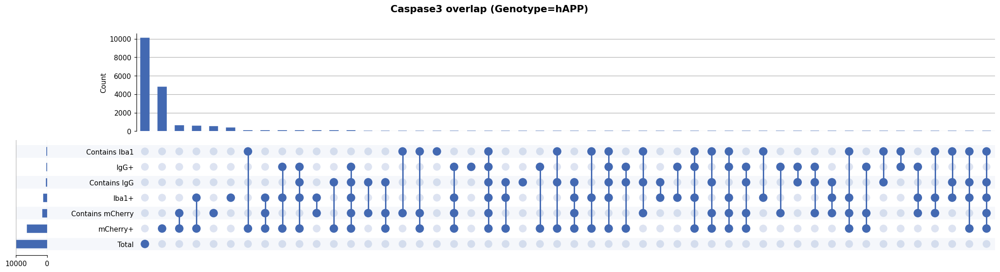

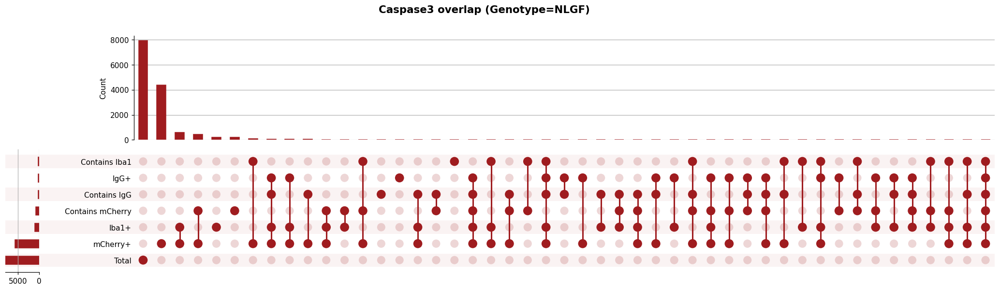

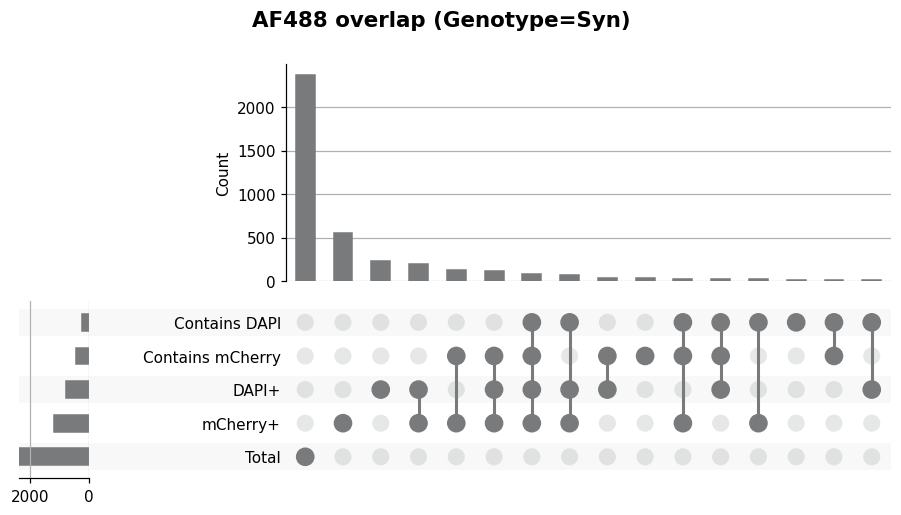

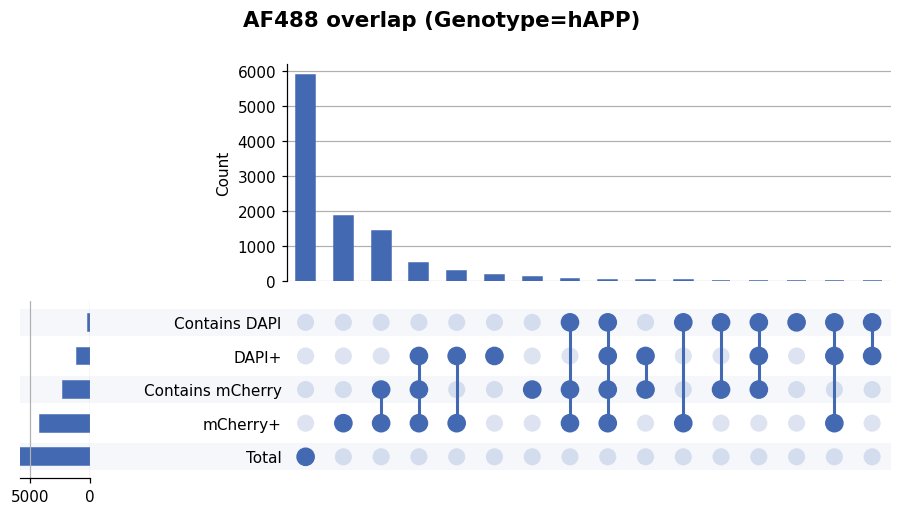

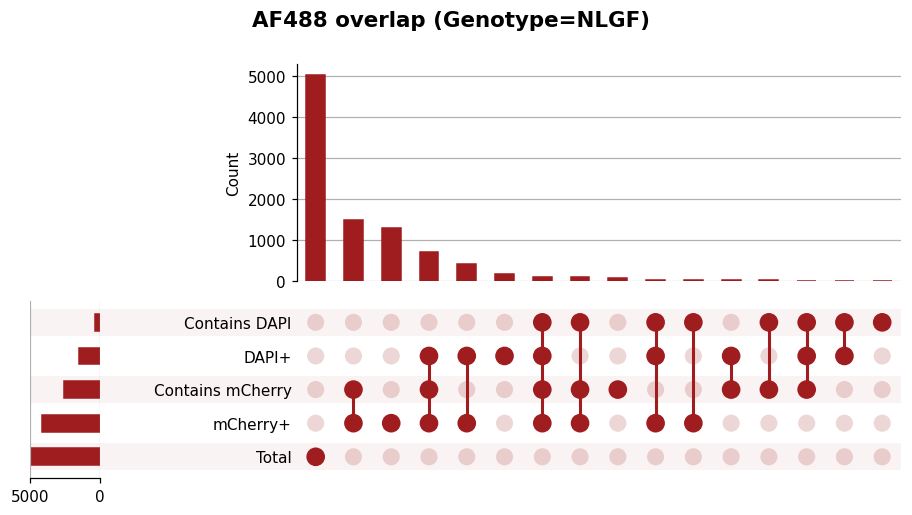

In [ ]:
# ── Plot Colocalisation Insights ─────────────────────────────────────────────
markers = ['CK1d', 'Iba1', 'Caspase3', 'AF488'] #Markers to plot
plotting.plot_coloc_upset(batch1, markers, by='Genotype', remove_closest=True) #Upset plot of marker colocalisation. Includes frequency of marker colocalisation and internalization and nearest neighbour
plotting.plot_coloc_sankey(batch1, markers, remove_closest=True, by='Genotype') #Sankey plot of marker colocalisation. Includes frequency of marker colocalisation and internalization and nearest neighbour

In [4]:
# ── Plot Histogams ─────────────────────────────────────────────
plotting.plot_histograms(batch1, marker='CK1d', x_attr='Volume', factor='Genotype', specificity=[("Time", "WeekEight")], combine=True, stat='density')

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\CK1d\Genotype\Time\WeekEight\CK1d_Volume Histogram (Combined).svg


{('Time',
  'WeekEight'): {'histogram': [<Axes: xlabel='CK1d Volume (µm³)', ylabel='Density'>,
   <Axes: xlabel='CK1d Volume (µm³)', ylabel='Density'>,
   <Axes: xlabel='CK1d Volume (µm³)', ylabel='Density'>], 'condition': [None,
   None,
   None], 'group': ['Syn-mCherry',
   'Syn-$\\mathregular{hAPP^{WT}}$-mCh',
   'Syn-$\\mathregular{hAPP^{NLGF}}$-mCh']}}

In [10]:
# ── Plot Pie Charts ─────────────────────────────────────────────
plotting.plot_pie_charts(batch1, marker=['CK1d', 'AF488'], x_attr='ColocmCherry', threshold=[0, 30],
                        as_counts=True, plot_format='bar', bottom_ticks=False,
                        factor='Genotype', specificity=[("Time", "WeekEight")])

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\CK1d\Genotype\Time\WeekEight\CK1d_ColocmCherry Bar (Combined) counts.svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\AF488\Genotype\Time\WeekEight\AF488_ColocmCherry Bar (Combined) counts.svg


{('CK1d',
  'ColocmCherry'): {('Time',
   'WeekEight'): {'pie_labels': [['<= 0', '> 0 and <= 30', '> 30'],
    ['<= 0', '> 0 and <= 30', '> 30'],
    ['<= 0', '> 0 and <= 30', '> 30']], 'pie_counts': [[67, 4, 4],
    [35, 12, 60],
    [59, 17, 148]], 'group': ['Syn-mCherry',
    'Syn-$\\mathregular{hAPP^{WT}}$-mCh',
    'Syn-$\\mathregular{hAPP^{NLGF}}$-mCh']}},
 ('AF488',
  'ColocmCherry'): {('Time',
   'WeekEight'): {'pie_labels': [['<= 0', '> 0 and <= 30', '> 30'],
    ['<= 0', '> 0 and <= 30', '> 30'],
    ['<= 0', '> 0 and <= 30', '> 30']], 'pie_counts': [[651, 148, 978],
    [833, 572, 2565],
    [284, 138, 1176]], 'group': ['Syn-mCherry',
    'Syn-$\\mathregular{hAPP^{WT}}$-mCh',
    'Syn-$\\mathregular{hAPP^{NLGF}}$-mCh']}}}

In [ ]:
# ── Plot Ridge Plots ─────────────────────────────────────────────
plotting.plot_ridgeline(batch_NLGFKI, marker=[ 'AF546'], x_attr=['Volume', 'ColocIba1'])

''

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/NLGFKI\Results\Python Figures\AF546\AF546_Volume Ridgeline.svg


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/NLGFKI\Results\Python Figures\AF546\AF546_ColocIba1 Ridgeline.svg


{('AF546',
  'Volume'): {'group': ['WTMale',
   '$\\mathregular{APP^{NLGF}}$Male',
   'WTFemale',
   '$\\mathregular{APP^{NLGF}}$Female'], 'n': [513, 661, 324, 897]},
 ('AF546',
  'ColocIba1'): {'group': ['WTMale',
   '$\\mathregular{APP^{NLGF}}$Male',
   'WTFemale',
   '$\\mathregular{APP^{NLGF}}$Female'], 'n': [513, 661, 324, 897]}}

In [4]:
plotting.plot_volcano(batch1, control='Syn', factor='Genotype', specificity=[("Time", "WeekEight")],
                      column_strings = ['IntDen', 'Count', '%Area'],
                      exclude = ['Non', 'Raw', 'ColocCount', 'mCherry']
                      )

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Volcano\Genotype\Time\WeekEight\Volcano hAPP vs Syn.svg
Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Volcano\Genotype\Time\WeekEight\Volcano NLGF vs Syn.svg


{('Time', 'WeekEight'): {'group': ['Syn', 'hAPP', 'NLGF'],
  'n_points': [0, 64, 64]}}

In [5]:
possible_predictors = ['H31L21_burdenScore:Genotype', 'Caspase3_fragmentationScore:Genotype', 'Iba1_burdenScore:Genotype', 'Caspase3_burdenScore:Genotype', 'GFAP_burdenScore:Drug', 'CK1d_burdenScore:Genotype', 'CK1d_fragmentationScore:Genotype', 'Genotype', 'Time', 'IgG_burdenScore:Genotype', 'AF488_burdenScore:Genotype']
columns = ['Count', 'IntDen', '%Area', 'Drug']
modelling.iterative_best_fit(batch_CK1I, max_features=2,
                            dependent_variable='PeriodMean_exp2', #possible_predictors=possible_predictors,
                            column_strings = columns, predictor_exclude = [ 'Error', 'IntDenMean', 'MeanIntDen', 'Non'],                            
                            repeat_features=True,
                            )

[iterative_best_fit] Removed 5 rows with NOT_INCLUDED sentinel values.
[iterative_best_fit] Bypassed predictors due to NaN values: MOAB-2_ColocCountDAPI%, MOAB-2_ColocCountCaspase3%, MOAB-2_ColocCountmCherry%, MOAB-2_Combo_Caspase3+_DAPI+_mCherry+_Count, MOAB-2_Combo_Caspase3+_mCherry+_Count, MOAB-2_Combo_Caspase3+_wCaspase3_DAPI+_mCherry+_Count, MOAB-2_Combo_Caspase3+_wCaspase3_mCherry+_Count, MOAB-2_Combo_DAPI+_Count, MOAB-2_Combo_DAPI+_mCherry+_Count, MOAB-2_Combo_DAPI+_wDAPI_Count, MOAB-2_Combo_DAPI+_wDAPI_mCherry+_Count, MOAB-2_Combo_DAPI+_wmCherry_Count, MOAB-2_Combo_mCherry+_Count, MOAB-2_Combo_mCherry+_wmCherry_Count, MOAB-2_Combo_wCaspase3_Count, MOAB-2_Combo_wCaspase3_DAPI+_Count, MOAB-2_Combo_wCaspase3_DAPI+_mCherry+_Count, MOAB-2_Combo_wCaspase3_DAPI+_wDAPI_mCherry+_Count, MOAB-2_Combo_wCaspase3_mCherry+_Count, MOAB-2_Combo_wCaspase3_wDAPI_Count, MOAB-2_Combo_wCaspase3_wDAPI_mCherry+_Count, MOAB-2_Combo_wDAPI_Count, MOAB-2_Combo_wDAPI_mCherry+_Count, MOAB-2_Combo_wmCherry_C

KeyboardInterrupt: 

In [4]:
plotting.plot_locations(batch1, 
                        objects=['CK1d'], extra_graphs=[('CK1d_Combo_DAPI+', 'CK1d_Combo_mCherry+', 'CK1d_Combo_DAPI+_mCherry+')],
                        images=[('DAPI', 'mCherry'), 'CK1d', ('DAPI', 'mCherry', 'CK1d')],
                        separate_by='animals', join_by='scns', specificity=[("AnimalName", "hAPP14WeekFour")],
                        draw_rois=[('DAPI', 'mCherry'), 'CK1d'], image_layout='separate',)

''

Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Python Figures\Locations\animal\AnimalName\hAPP14WeekFour\hAPP14WeekFour CK1d__CK1d_Combo_DAPI+__CK1d_74d89b43cf.svg


{('AnimalName',
  'hAPP14WeekFour'): {'name': ['hAPP14WeekFour',
   'hAPP14WeekFour',
   'hAPP14WeekFour',
   'hAPP14WeekFour']}}

In [5]:
import imagej
ij = imagej.init(mode='interactive')
dataset = ij.io().open("C:\\Users\\jamie\\UK Dementia Research Institute Dropbox\\Brancaccio Lab\\Jamie\\Experiments\\Amyloid Project\\2, 4, and 8 Weeks\\Results\\Representative Images\\IgG.Iba1.Cas3\\mCherry__Caspase3__Iba1\\None\\mCherry_SynWeekTwo_LHSCN.png")

ij.ui().show(dataset)

IndexError: list index out of range

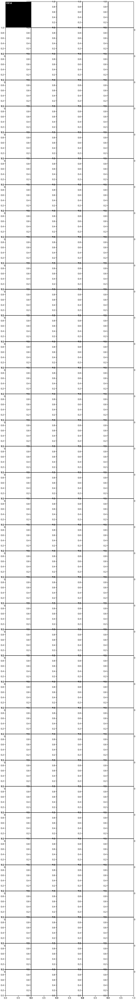

In [5]:
plotting.plot_images(batch1, markers=['CK1d'],
                     tile_gap=2, fast_loading=True, preview_max_dim=200, edit_mode=False)

In [6]:
plotting.select_representative_images(batch1, markers=['mCherry', 'Caspase3', 'Iba1'],
                                      preview_max_dim=200, block_layout='horizontal'
                                      )

,SelectionGroup,Condition,Experiment,AnimalName,ROI,RepresentativeMarkers,RepresentativeMarkerKey,SelectedAt
0,Syn-mCherry 2 Weeks,SynWeekTwo,IgG.Iba1.Cas3,Syn11WeekTwo,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:45
1,Syn-$\mathregular{hAPP^{WT}}$-mCh 2 Weeks,hAPPWeekTwo,IgG.Iba1.Cas3,hAPP1WeekTwo,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:45
2,Syn-$\mathregular{hAPP^{NLGF}}$-mCh 2 Weeks,NLGFWeekTwo,IgG.Iba1.Cas3,NLGF10WeekTwo,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:48
3,Syn-mCherry 4 Weeks,SynWeekFour,IgG.Iba1.Cas3,Syn1WeekFour,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:48
4,Syn-$\mathregular{hAPP^{WT}}$-mCh 4 Weeks,hAPPWeekFour,IgG.Iba1.Cas3,hAPP11WeekFour,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:50
5,Syn-$\mathregular{hAPP^{NLGF}}$-mCh 4 Weeks,NLGFWeekFour,IgG.Iba1.Cas3,NLGF5WeekFour,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:50
6,Syn-mCherry 8 Weeks,SynWeekEight,IgG.Iba1.Cas3,Syn1WeekEight,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:52
7,Syn-$\mathregular{hAPP^{WT}}$-mCh 8 Weeks,hAPPWeekEight,IgG.Iba1.Cas3,hAPP11WeekEight,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:53
8,Syn-$\mathregular{hAPP^{NLGF}}$-mCh 8 Weeks,NLGFWeekEight,IgG.Iba1.Cas3,NLGF10WeekEight,LHSCN,mCherry | Caspase3 | Iba1,caspase3|iba1|mcherry,2026-03-01T15:19:55


Figure saved to C:/Users/jamie/UK Dementia Research Institute Dropbox/Brancaccio Lab/Jamie/Experiments/Amyloid Project/2, 4, and 8 Weeks\Results\Representative Images\IgG.Iba1.Cas3\mCherry__Caspase3__Iba1\None\representative_images_by_Time_merged.svg


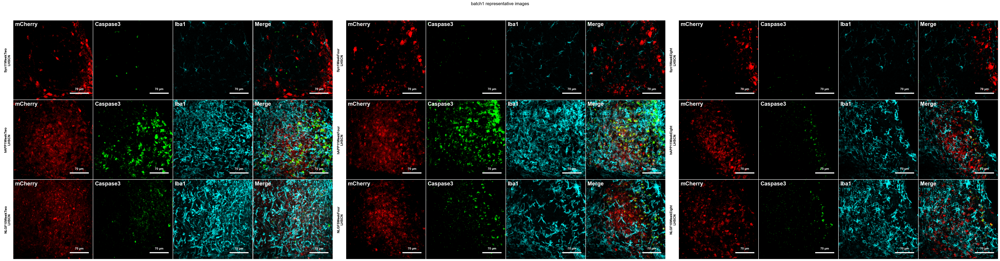

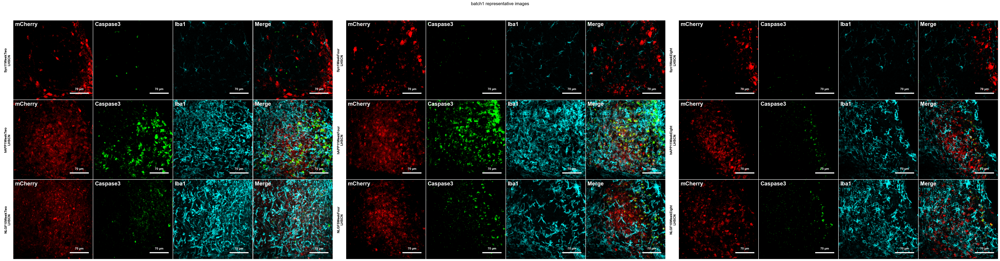

In [ ]:
plotting.plot_representative_images(batch1, markers=['mCherry','Caspase3', 'Iba1'], merge=True, 
                                    #fast_loading=True, preview_max_dim=300,
                                    block_by='Time', tile_gap=2, 
                                    scale_bar=True, scale_bar_size=70, scale_bar_location="bottom right", 
                                    edit_mode=True, use_existing_edits=True)